In [1]:
# from rotate_exp import rotate_experiment_loop
# from superpoint_local import SuperPointDetector
# detector = SuperPointDetector()
# rotate_experiment_loop(detector, img_to_show=1, err_th=3)




FILE: demo_imgs/hypersim/frame.0004.color.jpg

experiment for n rotations: 1
number of kpts: 629, 599
number of filtered kpts: 554, 554
distances between matching keypoints - min: 0.27930518984794617, max: 1.6422250270843506
Matched keypoints: 1108
Unmatched keypoints: 120


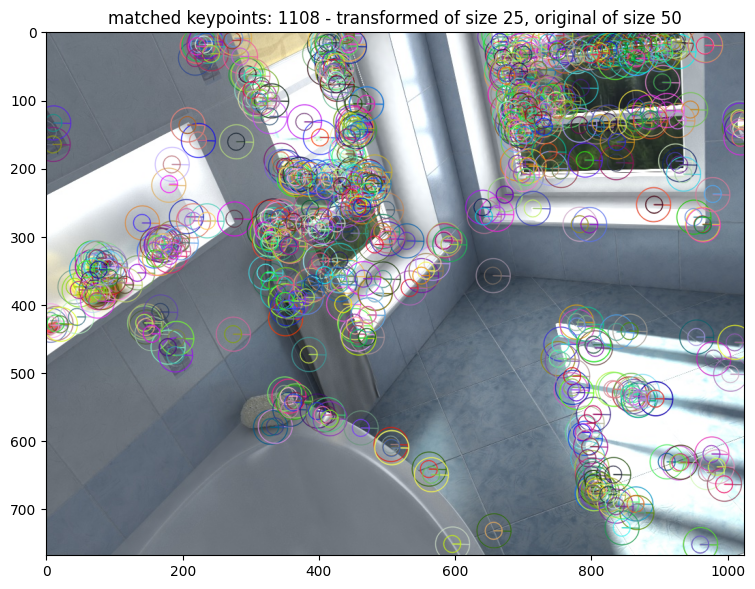

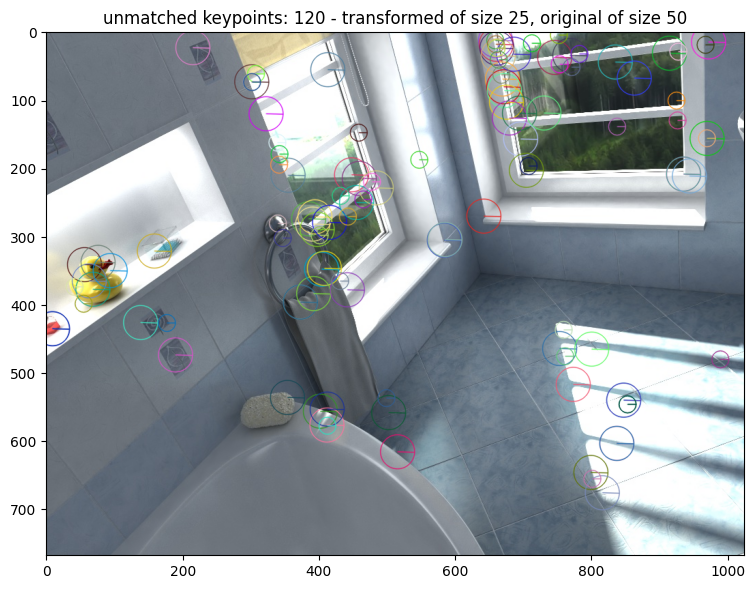

mean: [-0.5013749   0.00130843], variance: [0.01421148 0.01342115], std dev: [0.11921193 0.1158497 ]

experiment for n rotations: 2
number of kpts: 629, 603
number of filtered kpts: 523, 523
distances between matching keypoints - min: 0.1617802381515503, max: 2.3034753799438477
Matched keypoints: 1046
Unmatched keypoints: 186


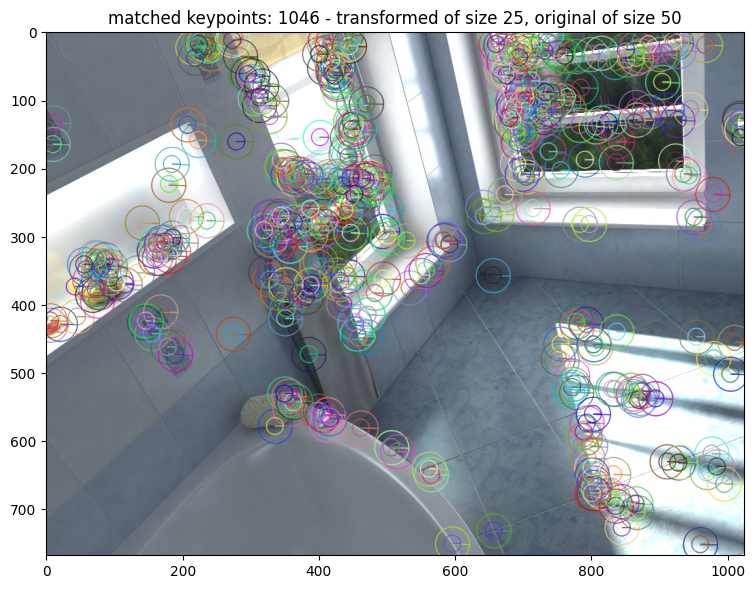

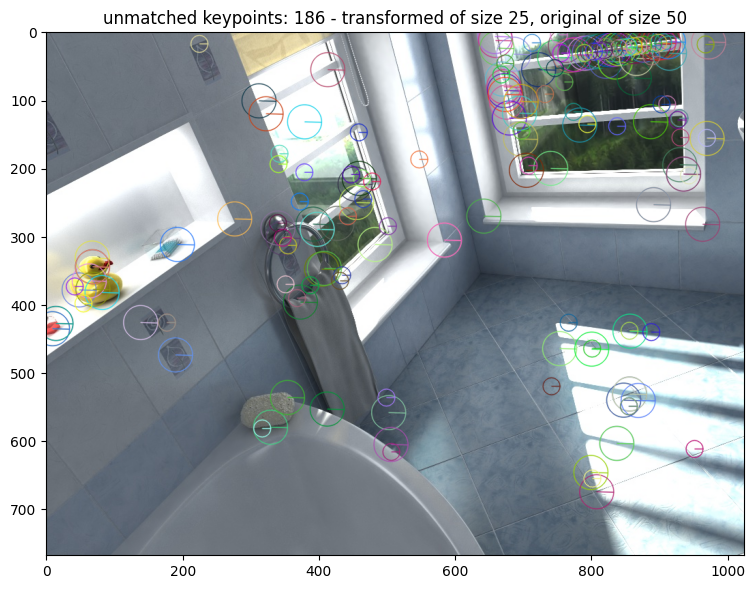

mean: [-0.5008793  -0.49890605], variance: [0.02439464 0.02310946], std dev: [0.15618785 0.15201797]

experiment for n rotations: 3
number of kpts: 629, 625
number of filtered kpts: 541, 541
distances between matching keypoints - min: 0.03643804043531418, max: 1.3553978204727173
Matched keypoints: 1082
Unmatched keypoints: 172


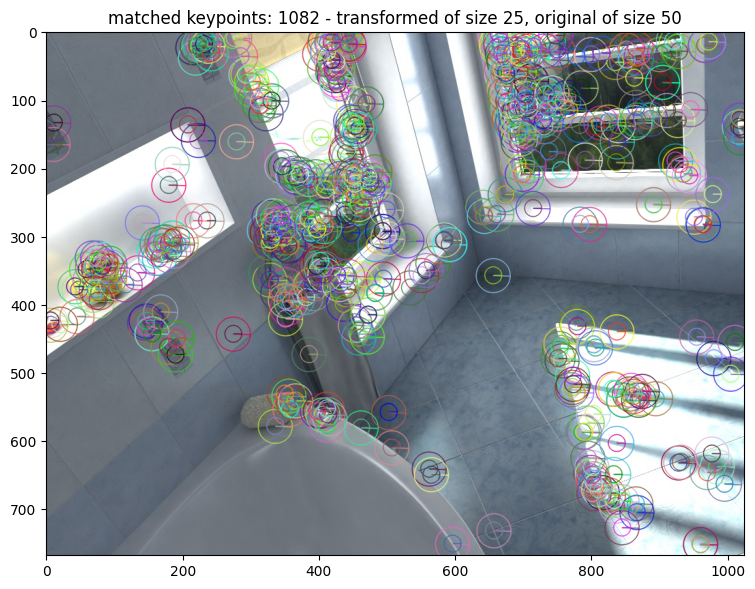

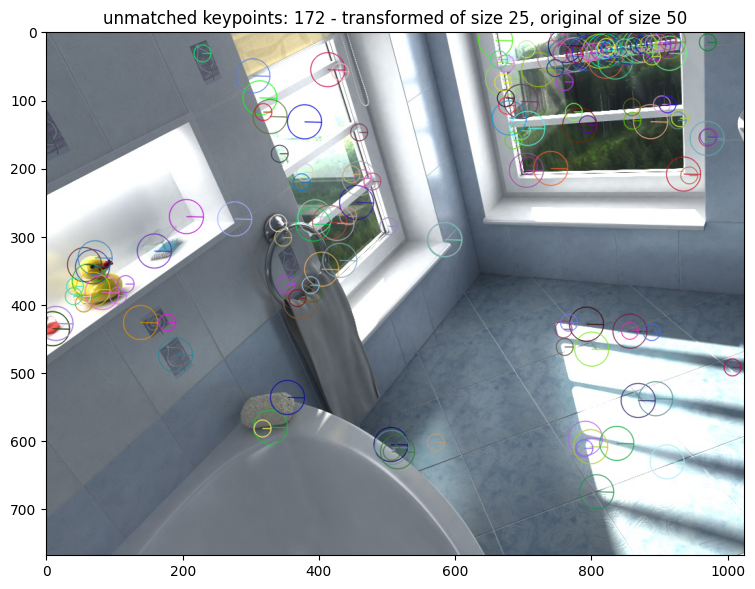

mean: [ 0.00141706 -0.4984586 ], variance: [0.00519927 0.01585534], std dev: [0.07210599 0.12591799]



In [2]:
from rotate_exp import rotate_experiment_loop
# from superpoint_local import SuperPointDetector
import cv2 as cv
detector = cv.SIFT_create()
rotate_experiment_loop(detector, img_to_show=1, err_th=3)


detector: adjusted opencv SIFT


FILE: demo_imgs/hypersim/frame.0004.color.jpg

experiment for n rotations: 1
number of kpts: 629, 599
number of filtered kpts: 554, 554
distances between matching keypoints - min: 0.0, max: 1.8342589139938354
Matched keypoints: 1108
Unmatched keypoints: 120


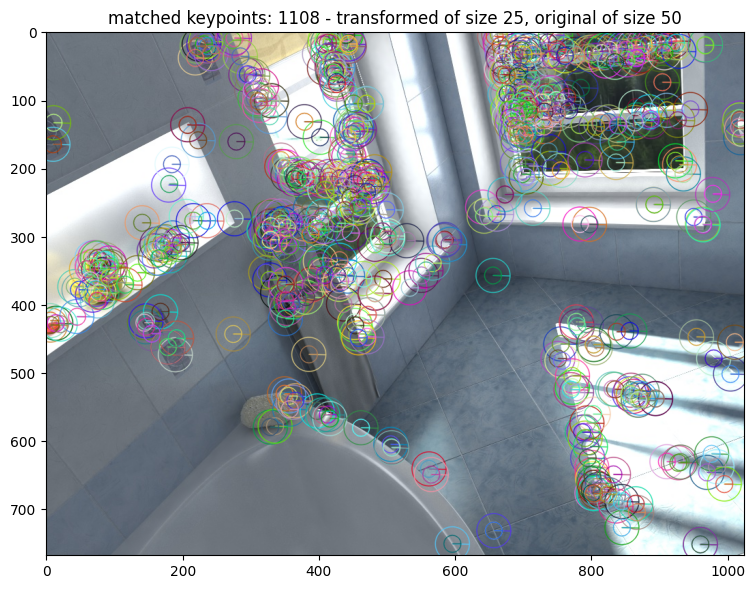

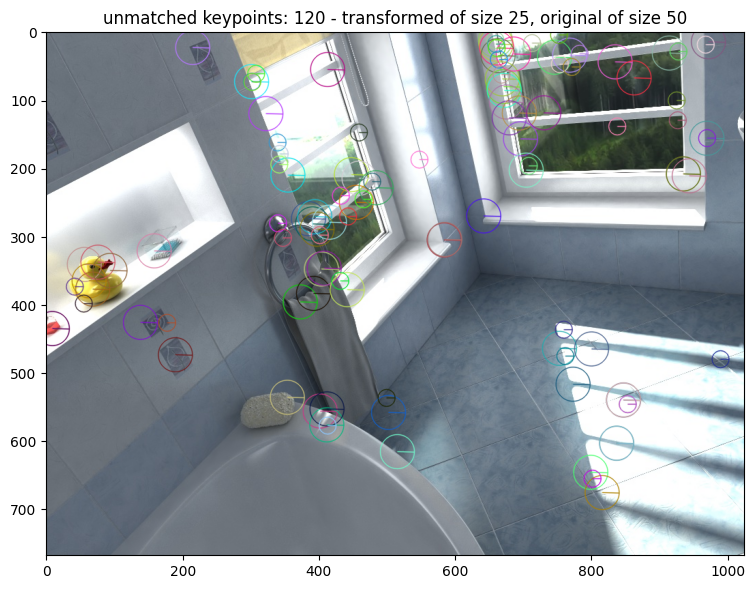

mean: [-0.0013749   0.00130843], variance: [0.01421148 0.01342115], std dev: [0.11921193 0.1158497 ]

experiment for n rotations: 2
number of kpts: 629, 603
number of filtered kpts: 523, 523
distances between matching keypoints - min: 0.0, max: 2.9780640602111816
Matched keypoints: 1046
Unmatched keypoints: 186


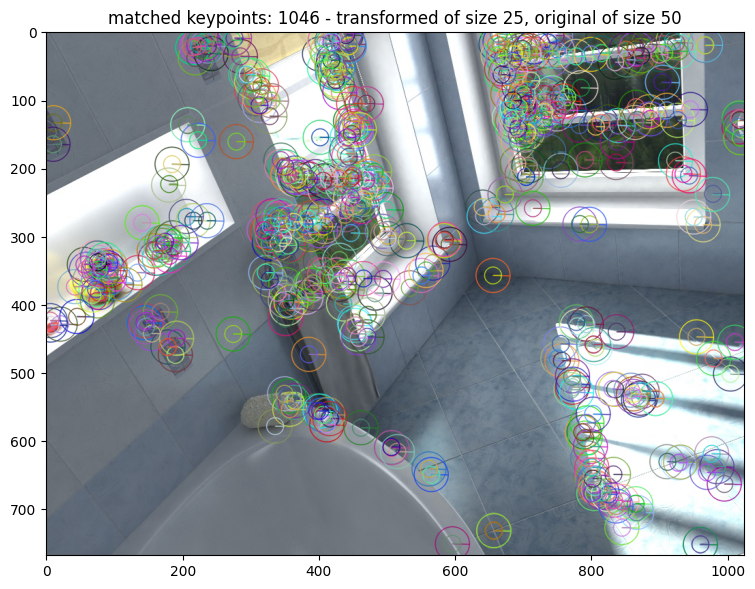

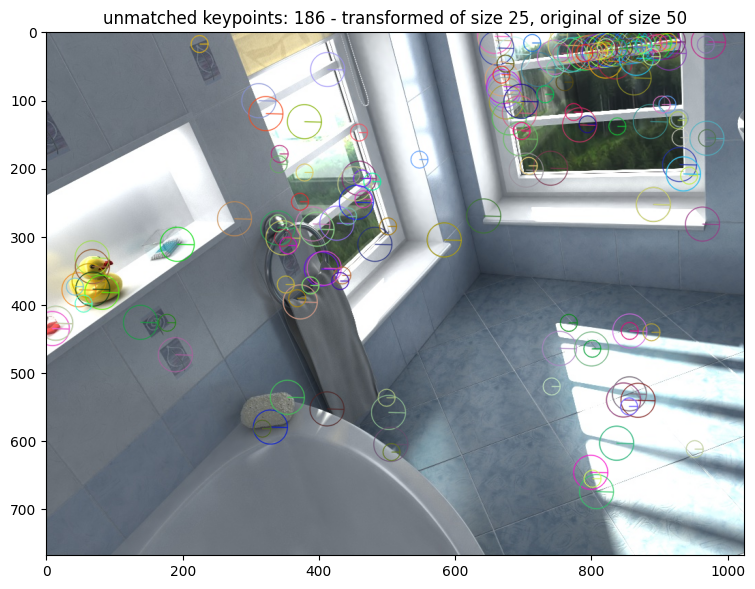

mean: [-0.00087932  0.00109401], variance: [0.02439464 0.02310946], std dev: [0.15618785 0.15201797]

experiment for n rotations: 3
number of kpts: 629, 625
number of filtered kpts: 541, 541
distances between matching keypoints - min: 0.0, max: 1.8025572299957275
Matched keypoints: 1082
Unmatched keypoints: 172


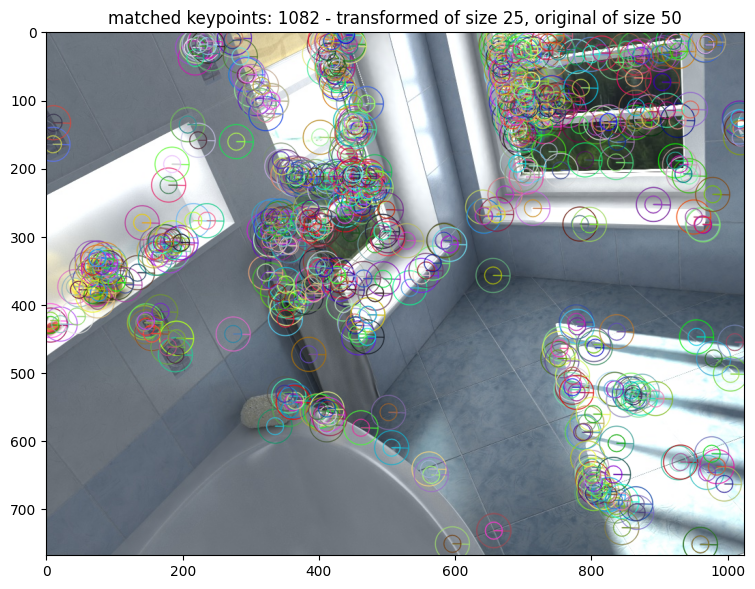

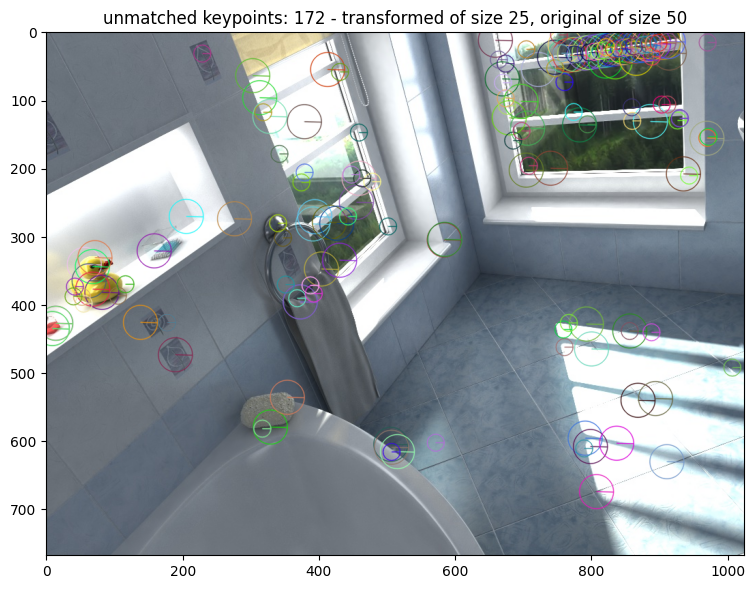

mean: [0.00141706 0.00154136], variance: [0.00519927 0.01585534], std dev: [0.07210599 0.12591799]



In [3]:
from sift_detectors import AdjustedSiftDescriptor

print("detector: adjusted opencv SIFT")
detector = AdjustedSiftDescriptor(adjustment=[-0.25, -0.25])
expected_bias = 0.0
rotate_experiment_loop(detector, img_to_show=1, err_th=3)


detector: kornia SIFT


FILE: demo_imgs/hypersim/frame.0004.color.jpg

experiment for n rotations: 1
number of kpts: 500, 500
number of filtered kpts: 242, 242
distances between matching keypoints - min: 0.0, max: 2.8284270763397217
Matched keypoints: 484
Unmatched keypoints: 516


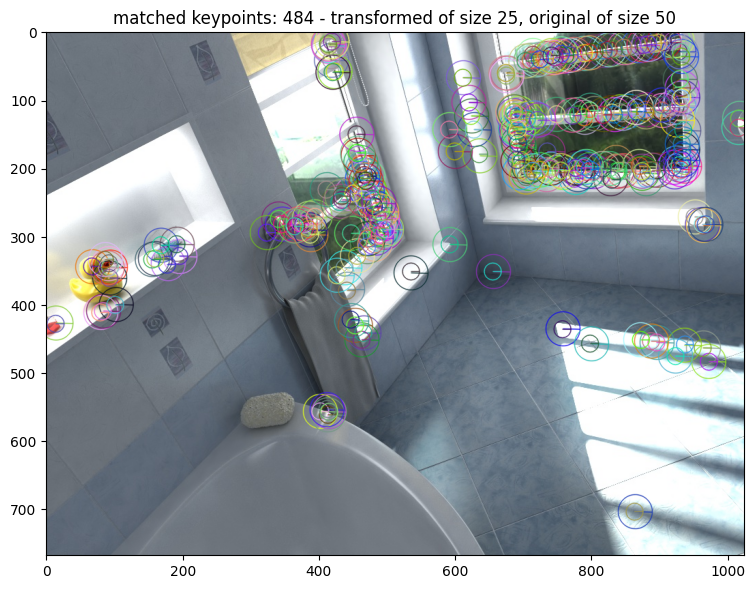

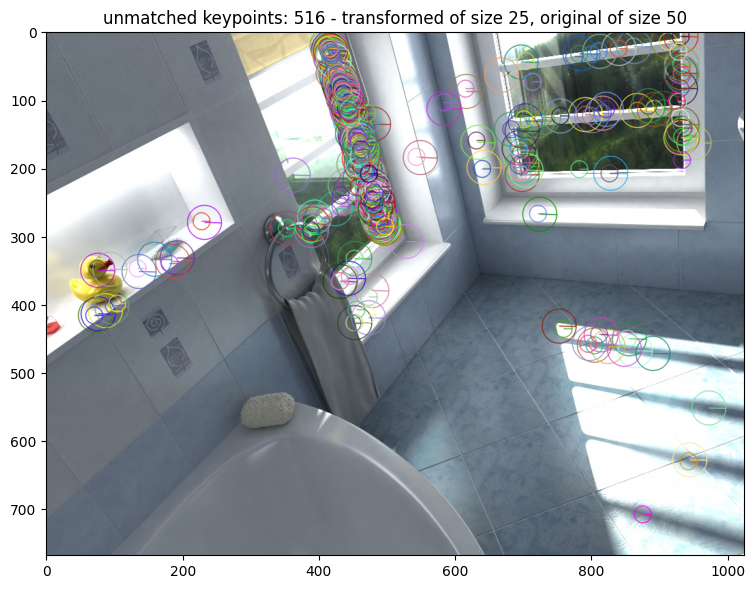

mean: [-0.5560359  -0.04684156], variance: [0.41304314 0.29675743], std dev: [0.64268434 0.54475445]

experiment for n rotations: 2
number of kpts: 500, 500
number of filtered kpts: 179, 179
distances between matching keypoints - min: 0.0, max: 2.8517143726348877
Matched keypoints: 358
Unmatched keypoints: 642


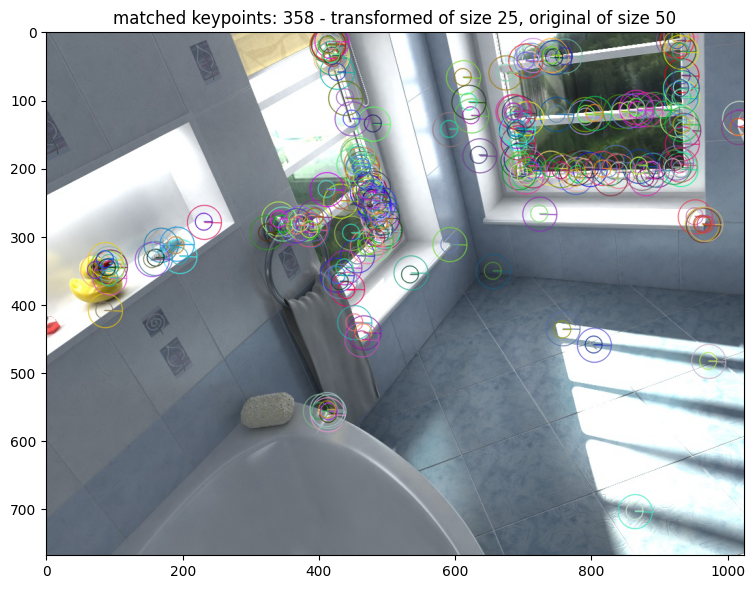

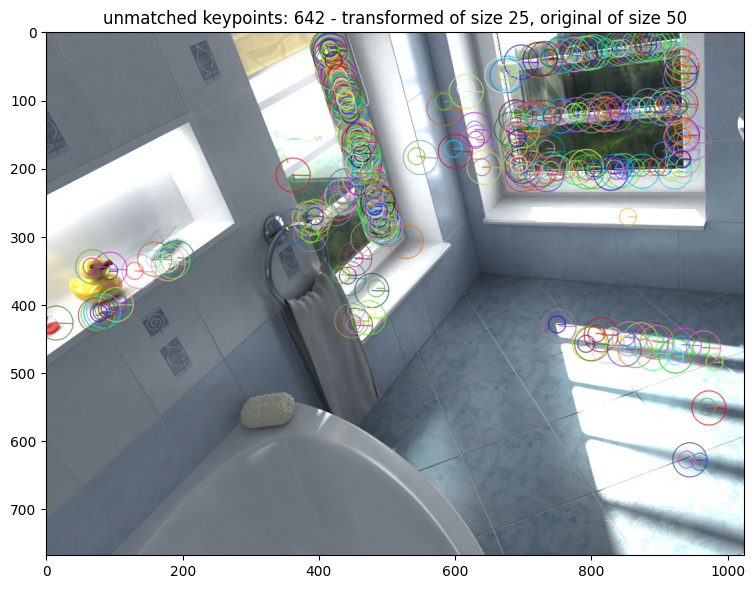

mean: [-0.5958118  -0.61093473], variance: [0.39267394 0.40939352], std dev: [0.626637  0.6398387]

experiment for n rotations: 3
number of kpts: 500, 500
number of filtered kpts: 223, 223
distances between matching keypoints - min: 0.0, max: 2.9593029022216797
Matched keypoints: 446
Unmatched keypoints: 554


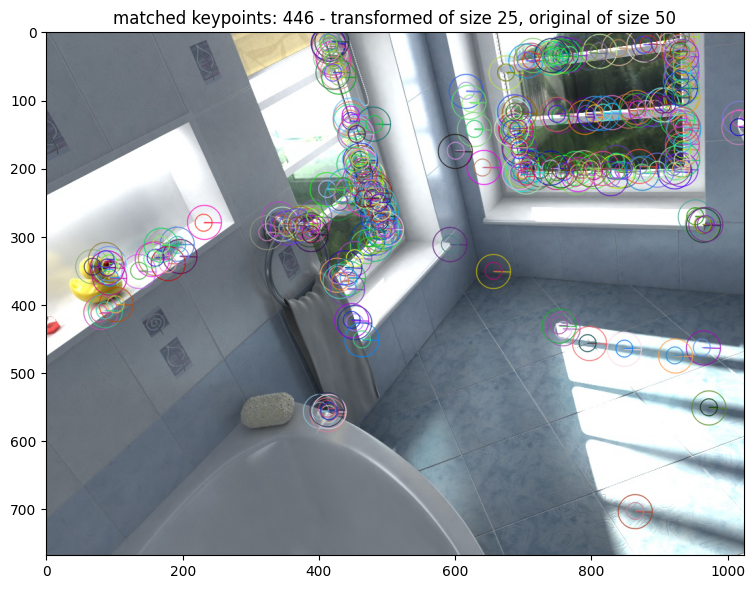

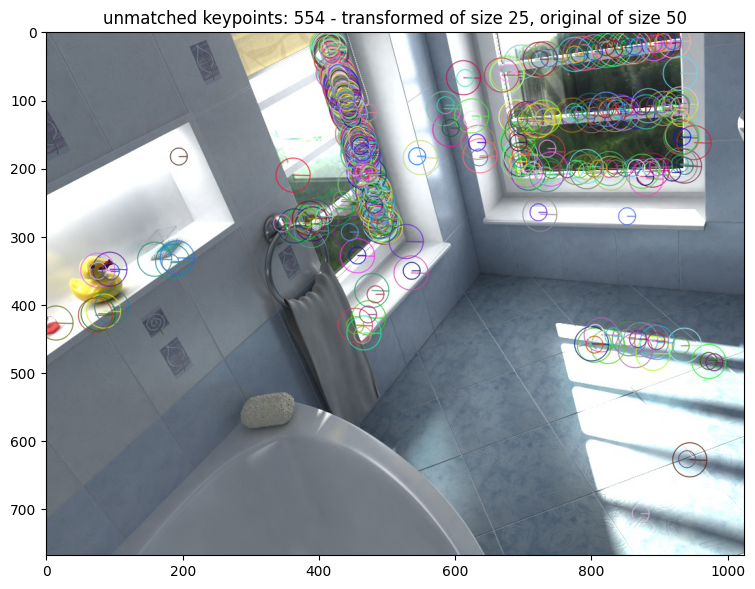

mean: [ 0.01811136 -0.5510271 ], variance: [0.36822966 0.40032917], std dev: [0.6068193 0.6327157]



In [3]:
from kornia_sift import NumpyKorniaSiftDescriptor

print("detector: kornia SIFT")
detector = NumpyKorniaSiftDescriptor()
rotate_experiment_loop(detector, img_to_show=1, err_th=3)


In [1]:
from rotate_exp import rotate_experiment_loop
from scale_pyramid import MyScalePyramid
from kornia_sift import NumpyKorniaSiftDescriptor

print("detector: kornia SIFT with bilinear subsampling")
# custom_scale_pyramid = MyScalePyramid(3, 1.6, 32, double_image=True)
detector = NumpyKorniaSiftDescriptor(nearest=False)
rotate_experiment_loop(detector, img_to_show=1, err_th=3)


detector: kornia SIFT with bilinear subsampling



KeyboardInterrupt



In [2]:
from rotate_exp import rotate_experiment_loop
from scale_pyramid import MyScalePyramid
from kornia_sift import NumpyKorniaSiftDescriptor

sp = MyScalePyramid(3, 1.6, 32, double_image=True, interpolation_mode='nearest')

detector = NumpyKorniaSiftDescriptor(scale_pyramid=sp)

for compensate_gauss in [False, True]:
    for gauss_separable in [True, False]:
        for intepolation_mode in ['nearest']: # ['lanczos', 'nearest', 'bilinear', 'bicubic']:
            for compensate_interpolation in [False, True]:
                sp.gauss_separable = gauss_separable
                sp.interpolation_mode = intepolation_mode
                print(f"""detector: kornia SIFT,
interpolation_mode: {sp.interpolation_mode}
compensate_gauss: {compensate_gauss}
compensate_interpolation: {compensate_interpolation}
gauss_separable: {gauss_separable}""")
                rotate_experiment_loop(detector, 
                                   img_to_show=1, 
                                   err_th=3, 
                                   compensate_gauss=compensate_gauss, 
                                   compensate_interpolation=compensate_interpolation,
                                   show_img=False)
        
                

detector: kornia SIFT,
interpolation_mode: nearest
compensate_gauss: False
compensate_interpolation: False
gauss_separable: True


FILE: demo_imgs/hypersim/frame.0004.color.jpg

experiment for n rotations: 1
number of kpts: 500, 500
number of filtered kpts: 242, 242
distances between matching keypoints - min: 0.0, max: 2.8284270763397217
Matched keypoints: 484
Unmatched keypoints: 516
mean: [-0.5560359  -0.04684156], variance: [0.41304314 0.29675743], std dev: [0.64268434 0.54475445]

experiment for n rotations: 2
number of kpts: 500, 500
number of filtered kpts: 179, 179
distances between matching keypoints - min: 0.0, max: 2.8517143726348877
Matched keypoints: 358
Unmatched keypoints: 642
mean: [-0.5958118  -0.61093473], variance: [0.39267394 0.40939352], std dev: [0.626637  0.6398387]

experiment for n rotations: 3
number of kpts: 500, 500
number of filtered kpts: 223, 223
distances between matching keypoints - min: 0.0, max: 2.9593029022216797
Matched keypoints: 446
Unmatched keypo

number of kpts: 500, 500
number of filtered kpts: 241, 241
distances between matching keypoints - min: 0.0, max: 3.0
Matched keypoints: 482
Unmatched keypoints: 518
mean: [0.00841114 0.06104495], variance: [0.09567386 0.843487  ], std dev: [0.30931193 0.9184155 ]



In [7]:
from rotate_exp import rotate_experiment_loop
from scale_pyramid import MyScalePyramid
from kornia_sift import NumpyKorniaSiftDescriptor

num_features = 8000
nearest_fix_sp = MyScalePyramid(3, 1.6, 32, double_image=False, interpolation_mode='nearest', gauss_separable=True, every_2nd=True)
nearest_fix_sp_d = MyScalePyramid(3, 1.6, 32, double_image=True, interpolation_mode='nearest', gauss_separable=True, every_2nd=True)


for sc_p in [nearest_fix_sp_d, nearest_fix_sp]:
    for adj in [0.0, -0.125, -0.25, -0.375, -0.5]:
        detector = NumpyKorniaSiftDescriptor(num_features=num_features, 
                                             scale_pyramid=sc_p, 
                                             scatter_fix=True, 
                                             swap_xy_fix=True, 
                                             conv_quad_interp_adjustment=adj)
        print(f"detector: {detector}")
        rotate_experiment_loop(detector, 
                                   img_to_show=1, 
                                   err_th=3, 
                                   compensate_gauss=False, 
                                   compensate_interpolation=False,
                                   show_img=False)
        
                

detector: SIFTKornia di=T adj=tensor([0., 0.]) mns=(sf=True,sw=True,adj=0.0)


FILE: demo_imgs/hypersim/frame.0004.color.jpg

experiment for n rotations: 1
number of kpts: 8000, 8000
number of filtered kpts: 6212, 6212
distances between matching keypoints - min: 0.0, max: 3.0
Matched keypoints: 12424
Unmatched keypoints: 3576
mean: [-0.51609993 -0.00448026], variance: [0.07757696 0.06666903], std dev: [0.2785264  0.25820348]

experiment for n rotations: 2
number of kpts: 8000, 8000
number of filtered kpts: 5611, 5611
distances between matching keypoints - min: 0.0, max: 3.0
Matched keypoints: 11222
Unmatched keypoints: 4778
mean: [-0.51157326 -0.5209237 ], variance: [0.09261612 0.10311865], std dev: [0.30432898 0.32112092]

experiment for n rotations: 3
number of kpts: 8000, 8000
number of filtered kpts: 6235, 6235
distances between matching keypoints - min: 0.0, max: 3.0
Matched keypoints: 12470
Unmatched keypoints: 3530
mean: [-0.00327029 -0.50730354], variance: [0.06741422 0.0697741

number of kpts: 8000, 8000
number of filtered kpts: 2519, 2519
distances between matching keypoints - min: 0.0, max: 3.0
Matched keypoints: 5038
Unmatched keypoints: 10962
mean: [0.00560863 0.24524914], variance: [0.16460712 0.8370995 ], std dev: [0.40571803 0.9149314 ]

detector: SIFTKornia di=F adj=tensor([0., 0.]) mns=(sf=True,sw=True,adj=-0.375)


FILE: demo_imgs/hypersim/frame.0004.color.jpg

experiment for n rotations: 1
number of kpts: 8000, 8000
number of filtered kpts: 4918, 4918
distances between matching keypoints - min: 0.06305085122585297, max: 3.0
Matched keypoints: 9836
Unmatched keypoints: 6164
mean: [-0.601802   -0.00262239], variance: [1.3665556  0.03457167], std dev: [1.1689976  0.18593459]

experiment for n rotations: 2
number of kpts: 8000, 8000
number of filtered kpts: 1939, 1939
distances between matching keypoints - min: 0.0, max: 2.983227252960205
Matched keypoints: 3878
Unmatched keypoints: 12122
mean: [0.1786729  0.12064197], variance: [1.0760986 1.1543051], 

In [8]:
from rotate_exp import rotate_experiment_loop
from scale_pyramid import MyScalePyramid
from kornia_sift import NumpyKorniaSiftDescriptor

num_features = 8000
nearest_fix_sp = MyScalePyramid(3, 1.6, 32, double_image=False, interpolation_mode='nearest', gauss_separable=True, every_2nd=True)
nearest_fix_sp_d = MyScalePyramid(3, 1.6, 32, double_image=True, interpolation_mode='nearest', gauss_separable=True, every_2nd=True)


for sc_p in [nearest_fix_sp_d, nearest_fix_sp]:
    for adj in [0.0, -0.25, -0.5, -0.75, -1.0]:
        detector = NumpyKorniaSiftDescriptor(num_features=num_features, 
                                             scale_pyramid=sc_p, 
                                             scatter_fix=True, 
                                             swap_xy_fix=True, 
                                             adjustment=[adj, adj])
        print(f"detector: {detector}")
        rotate_experiment_loop(detector, 
                                   img_to_show=1, 
                                   err_th=3, 
                                   compensate_gauss=False, 
                                   compensate_interpolation=False,
                                   show_img=False)
        
                

detector: SIFTKornia di=T adj=tensor([0., 0.]) mns=(sf=True,sw=True,adj=0.0)


FILE: demo_imgs/hypersim/frame.0004.color.jpg

experiment for n rotations: 1
number of kpts: 8000, 8000
number of filtered kpts: 6212, 6212
distances between matching keypoints - min: 0.0, max: 3.0
Matched keypoints: 12424
Unmatched keypoints: 3576
mean: [-0.51609993 -0.00448026], variance: [0.07757696 0.06666903], std dev: [0.2785264  0.25820348]

experiment for n rotations: 2
number of kpts: 8000, 8000
number of filtered kpts: 5611, 5611
distances between matching keypoints - min: 0.0, max: 3.0
Matched keypoints: 11222
Unmatched keypoints: 4778
mean: [-0.51157326 -0.5209237 ], variance: [0.09261612 0.10311865], std dev: [0.30432898 0.32112092]

experiment for n rotations: 3
number of kpts: 8000, 8000
number of filtered kpts: 6235, 6235
distances between matching keypoints - min: 0.0, max: 3.0
Matched keypoints: 12470
Unmatched keypoints: 3530
mean: [-0.00327029 -0.50730354], variance: [0.06741422 0.0697741

Matched keypoints: 3466
Unmatched keypoints: 12534
mean: [0.45757547 0.44256935], variance: [0.70613766 0.72385246], std dev: [0.84032   0.8507952]

experiment for n rotations: 3
number of kpts: 8000, 8000
number of filtered kpts: 2589, 2589
distances between matching keypoints - min: 0.0, max: 2.9121665954589844
Matched keypoints: 5178
Unmatched keypoints: 10822
mean: [0.0010583 0.4302021], variance: [0.10857327 0.7104299 ], std dev: [0.32950458 0.84287006]

detector: SIFTKornia di=F adj=tensor([-0.7500, -0.7500]) mns=(sf=True,sw=True,adj=0.0)


FILE: demo_imgs/hypersim/frame.0004.color.jpg

experiment for n rotations: 1
number of kpts: 8000, 8000
number of filtered kpts: 2890, 2890
distances between matching keypoints - min: 0.06305085122585297, max: 2.957735776901245
Matched keypoints: 5780
Unmatched keypoints: 10220
mean: [ 0.31336707 -0.00149727], variance: [1.7348211  0.06915492], std dev: [1.317126   0.26297322]

experiment for n rotations: 2
number of kpts: 8000, 8000
number of